In [1]:
import os
import flopy
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
import shutil

In [2]:
# the location og the original model folder
org_workspace = os.path.join('..','data','SGN_model_GWvistas')

# make a copy of orignal model files so as to not mess things up
workspace = os.path.join('.','sgn_model')

if os.path.exists(workspace):
    shutil.rmtree(workspace)
shutil.copytree(org_workspace, workspace)

'.\\sgn_model'

In [3]:
# get the spatial refernce from the model
sim = flopy.mf6.MFSimulation.load(sim_ws=workspace, verbosity_level=1)

print(sim.model_names)

loading simulation...
  loading simulation name file...
  loading tdis package...
  loading model gwf6...
    loading package disu...
    loading package ic...
    loading package oc...
    loading package npf...
    loading package riv...
    loading package ghb...
    loading package wel...
    loading package rch...
  loading ims package mf6model...
odict_keys(['mf6model'])


In [4]:
m = sim.get_model("mf6model")

In [5]:
m.dis.plot()

In [6]:
m.npf.plot()

In [8]:
sim.run_simulation()

FloPy is using the following  executable to run the model: C:\Program Files\MODFLOW\mf6.2.0\bin\mf6.exe
                                   MODFLOW 6
                U.S. GEOLOGICAL SURVEY MODULAR HYDROLOGIC MODEL
                            VERSION 6.2.1 02/18/2021

   MODFLOW 6 compiled Feb 18 2021 08:24:05 with IFORT compiler (ver. 19.10.2)

This software has been approved for release by the U.S. Geological 
Survey (USGS). Although the software has been subjected to rigorous 
review, the USGS reserves the right to update the software as needed 
pursuant to further analysis and review. No warranty, expressed or 
implied, is made by the USGS or the U.S. Government as to the 
functionality of the software and related material nor shall the 
fact of release constitute any such warranty. Furthermore, the 
software is released on condition that neither the USGS nor the U.S. 
Government shall be held liable for any damages resulting from its 
authorized or unauthorized use. Also refer to th

(True, [])

In [9]:
sim.name

'modflowsim'

In [10]:
hdsobj = flopy.utils.HeadFile(os.path.join(workspace,"SGN.hds"),model=m)
kstpkper = hdsobj.get_kstpkper()
hds = hdsobj.get_data(kstpkper=kstpkper[0], mflay=0)
hds.shape

(1, 50124)

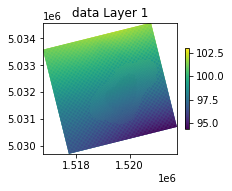

In [11]:
hdsobj.plot(contour=False, grid=False, colorbar=True, figsize=(3,3));